# 顔検出課題：卒業式・授賞式の集合写真から人数カウント

## テーマ
卒業式や授賞式などの集合写真から、**顔検出技術を用いて参加者の人数を自動でカウント**します。

## 使用する手法
今回は以下の**2つの顔検出手法**を使用し、それぞれの特性を比較します：

1. **YOLO (You Only Look Once)**
   - 高速な物体検出アルゴリズム
   - リアルタイム処理に向いている
   - YOLOv8-faceモデルを使用

2. **MTCNN (Multi-task Cascaded Convolutional Networks)**
   - 顔検出専用のディープラーニングモデル
   - 高精度で、小さな顔も検出しやすい
   - 3段階のカスケード構造

## 環境セットアップ

必要なライブラリをインストールします

```bash
pip install opencv-python pillow numpy matplotlib
pip install ultralytics  # YOLO
pip install mtcnn tensorflow  # MTCNN
```

In [1]:
# ライブラリのインポート
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time

# YOLO
from ultralytics import YOLO

# MTCNN
from mtcnn import MTCNN

# 日本語フォント設定（matplotlib用）
plt.rcParams['font.sans-serif'] = ['MS Gothic', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

## 1. 画像の読み込み

卒業式・授賞式の集合写真を読み込みます。

画像サイズ: 1024 x 768 ピクセル
チャンネル数: 3


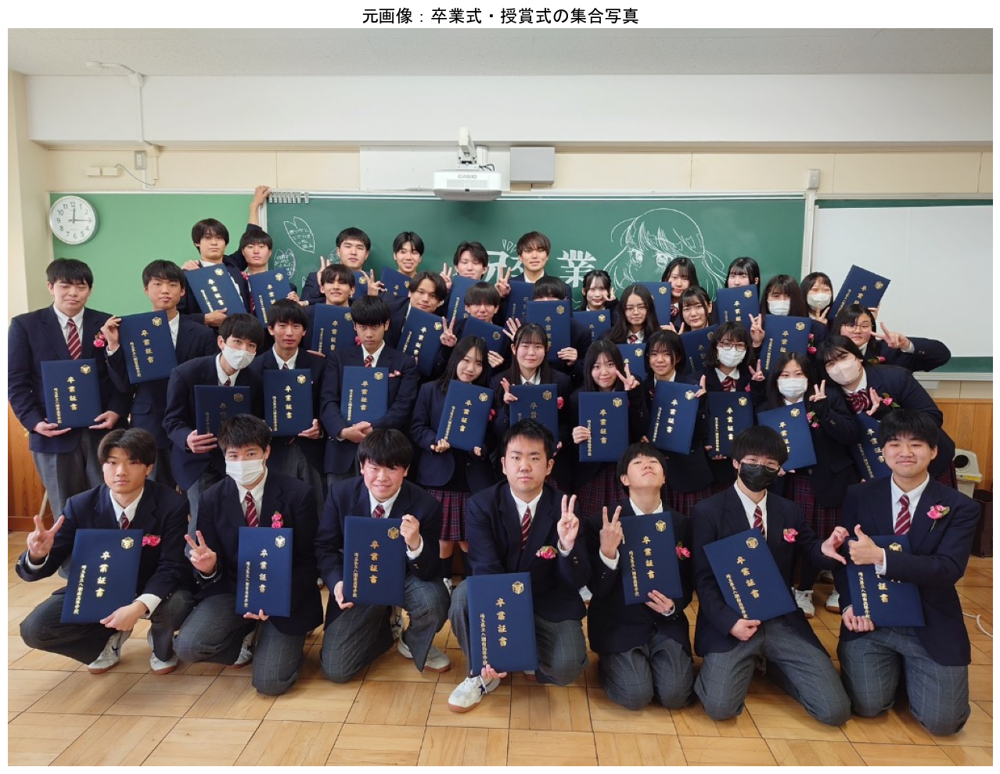

In [2]:
# 画像の読み込み
image_path = 'class_photo.jpg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 画像情報の表示
print(f"画像サイズ: {image.shape[1]} x {image.shape[0]} ピクセル")
print(f"チャンネル数: {image.shape[2]}")

# 元画像の表示
plt.figure(figsize=(15, 10))
plt.imshow(image_rgb)
plt.title('元画像：卒業式・授賞式の集合写真', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

## 2. YOLO による顔検出

YOLOv8-faceモデルを使用して顔検出を行います。

In [3]:
# YOLOv8モデルのロード（顔検出用の事前学習モデルを使用）
# 注: yolov8n-face.pt は別途ダウンロードが必要な場合があります
# ここでは一般的なYOLOv8nモデルで代替することもできます

try:
    # 顔検出専用モデルを試みる
    model_yolo = YOLO('yolov8n-face.pt')
except:
    # 代替として一般的な物体検出モデルを使用
    print("顔検出専用モデルが見つかりません。一般的なYOLOv8モデルを使用します。")
    model_yolo = YOLO('yolov8n.pt')

# 処理時間の計測開始
start_time = time.time()

# 顔検出の実行
results_yolo = model_yolo(image_path, conf=0.3)

# 処理時間の計測終了
yolo_time = time.time() - start_time

# 検出結果の取得
detections_yolo = results_yolo[0].boxes
num_faces_yolo = len(detections_yolo)

print(f"YOLO検出結果: {num_faces_yolo} 人")
print(f"処理時間: {yolo_time:.3f} 秒")

顔検出専用モデルが見つかりません。一般的なYOLOv8モデルを使用します。

image 1/1 c:\Users\ryoya\OneDrive\Documents\\\me\Week11\face\class_photo.jpg: 480x640 13 persons, 2 ties, 1 clock, 115.8ms
Speed: 92.6ms preprocess, 115.8ms inference, 5.6ms postprocess per image at shape (1, 3, 480, 640)
YOLO検出結果: 16 人
処理時間: 0.375 秒


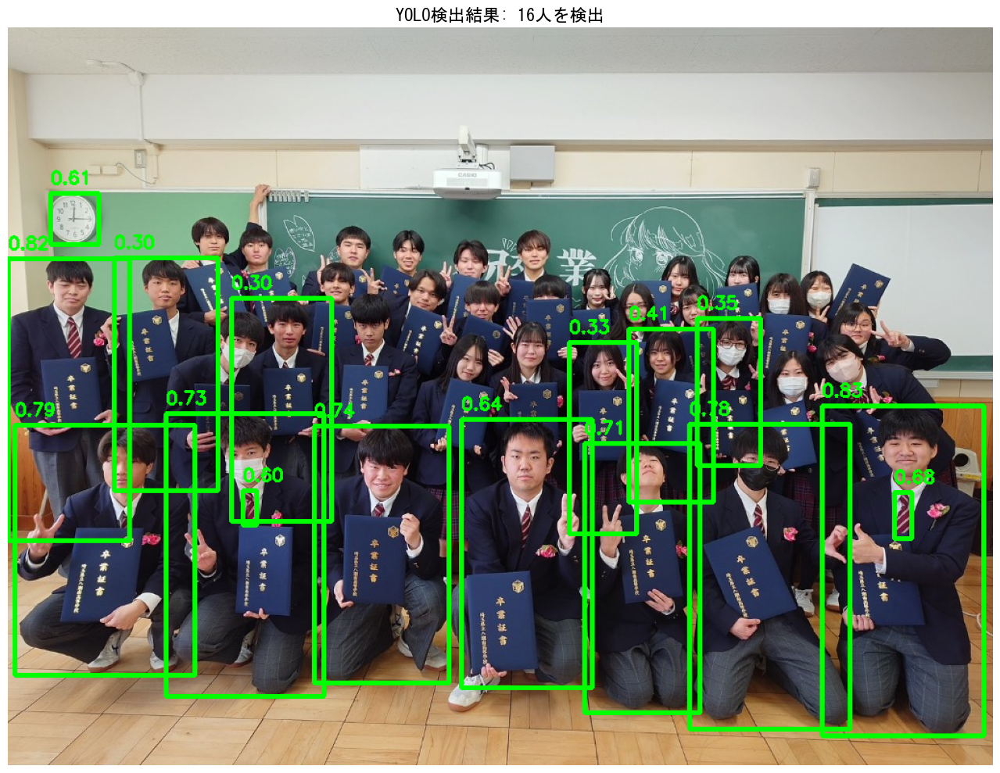

In [4]:
# YOLOの検出結果を可視化
image_yolo = image_rgb.copy()

for box in detections_yolo:
    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
    conf = box.conf[0].cpu().numpy()
    
    # バウンディングボックスの描画
    cv2.rectangle(image_yolo, (x1, y1), (x2, y2), (0, 255, 0), 3)
    cv2.putText(image_yolo, f'{conf:.2f}', (x1, y1-10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

# 結果の表示
plt.figure(figsize=(15, 10))
plt.imshow(image_yolo)
plt.title(f'YOLO検出結果: {num_faces_yolo}人を検出', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

### YOLOの強み・弱み

**強み：**
- **処理速度が非常に速い**：リアルタイム処理が可能
- **実装が簡単**：モデルのロードと推論が数行で完結
- **汎用性が高い**：顔以外の物体検出にも応用可能

**弱み：**
- **小さな顔の検出精度が低い**：後列の小さな顔を見逃す可能性がある
- **マスク着用時の精度低下**：顔の一部が隠れていると検出しにくい
- **顔専用モデルの入手**：YOLOv8-faceなど専用モデルが必要

## 3. MTCNN による顔検出

MTCNNは顔検出専用のモデルで、高精度な検出が期待できます。

In [5]:
# MTCNNモデルの初期化
detector_mtcnn = MTCNN()

# 処理時間の計測開始
start_time = time.time()

# 顔検出の実行
detections_mtcnn = detector_mtcnn.detect_faces(image_rgb)

# 処理時間の計測終了
mtcnn_time = time.time() - start_time

# 検出結果の取得
num_faces_mtcnn = len(detections_mtcnn)

print(f"MTCNN検出結果: {num_faces_mtcnn} 人")
print(f"処理時間: {mtcnn_time:.3f} 秒")

Exception ignored in: <_io.BufferedReader>
Traceback (most recent call last):
  File "c:\Users\ryoya\AppData\Local\Programs\Python\Python313\Lib\site-packages\lz4\frame\__init__.py", line 753, in flush
    self._fp.flush()
ValueError: I/O operation on closed file.
Exception ignored in: <_io.BufferedReader>
Traceback (most recent call last):
  File "c:\Users\ryoya\AppData\Local\Programs\Python\Python313\Lib\site-packages\lz4\frame\__init__.py", line 753, in flush
    self._fp.flush()
ValueError: I/O operation on closed file.
Exception ignored in: <_io.BufferedReader>
Traceback (most recent call last):
  File "c:\Users\ryoya\AppData\Local\Programs\Python\Python313\Lib\site-packages\lz4\frame\__init__.py", line 753, in flush
    self._fp.flush()
ValueError: I/O operation on closed file.


MTCNN検出結果: 35 人
処理時間: 0.709 秒


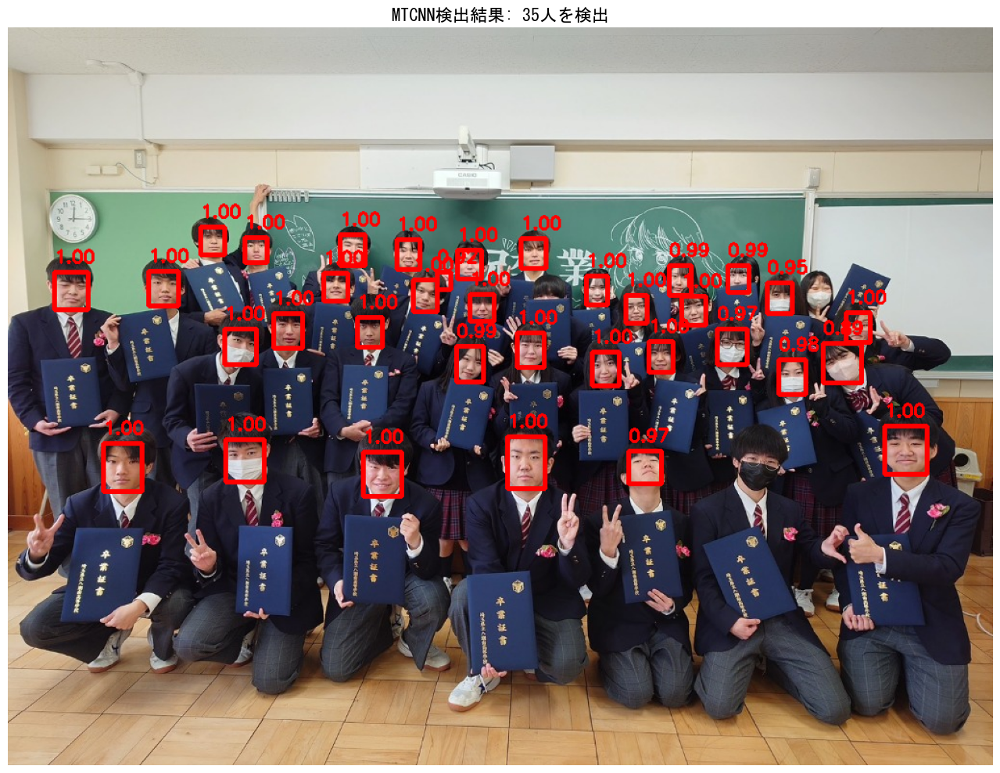

In [6]:
# MTCNNの検出結果を可視化
image_mtcnn = image_rgb.copy()

for detection in detections_mtcnn:
    x, y, width, height = detection['box']
    confidence = detection['confidence']
    
    # バウンディングボックスの描画
    cv2.rectangle(image_mtcnn, (x, y), (x+width, y+height), (255, 0, 0), 3)
    cv2.putText(image_mtcnn, f'{confidence:.2f}', (x, y-10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

# 結果の表示
plt.figure(figsize=(15, 10))
plt.imshow(image_mtcnn)
plt.title(f'MTCNN検出結果: {num_faces_mtcnn}人を検出', fontsize=16)
plt.axis('off')
plt.tight_layout()
plt.show()

### MTCNNの強み・弱み

**強み：**
- **顔検出専用で高精度**：顔の特徴を正確に捉える
- **小さな顔も検出可能**：後列の小さな顔も比較的よく検出できる
- **顔のランドマーク検出**：目、鼻、口の位置も取得可能（今回は未使用）

**弱み：**
- **処理速度が遅い**：YOLOと比較して時間がかかる
- **マスク着用時の精度低下**：顔の下半分が隠れていると検出しにくい
- **メモリ消費が大きい**：大きな画像では処理に時間とメモリが必要

## 4.5 アンサンブル手法：YOLOとMTCNNの統合

両手法の検出結果を**投票+マージ方式**で統合し、より高精度な顔検出を実現します。

### 統合の仕組み
1. **IoU（Intersection over Union）**を計算して、同じ顔を検出しているか判定
2. IoU > 0.3 の場合、同じ顔と判定して統合
3. 信頼度が高い方のボックスを採用
4. どちらか一方のみが検出した顔も採用（見逃しを減らす）

In [7]:
def calculate_iou(box1, box2):
    """
    2つのバウンディングボックスのIoU（Intersection over Union）を計算
    box1, box2: [x1, y1, x2, y2] 形式
    """
    # 交差領域の座標を計算
    x1_inter = max(box1[0], box2[0])
    y1_inter = max(box1[1], box2[1])
    x2_inter = min(box1[2], box2[2])
    y2_inter = min(box1[3], box2[3])
    
    # 交差領域の面積
    inter_area = max(0, x2_inter - x1_inter) * max(0, y2_inter - y1_inter)
    
    # 各ボックスの面積
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    
    # 結合領域の面積
    union_area = box1_area + box2_area - inter_area
    
    # IoU計算
    iou = inter_area / union_area if union_area > 0 else 0
    return iou

def ensemble_detections(yolo_boxes, mtcnn_boxes, iou_threshold=0.3):
    """
    YOLOとMTCNNの検出結果を統合
    yolo_boxes: [[x1, y1, x2, y2, conf], ...]
    mtcnn_boxes: [[x1, y1, x2, y2, conf], ...]
    """
    ensemble_boxes = []
    used_mtcnn = [False] * len(mtcnn_boxes)
    
    # YOLOの各検出について、MTCNNと比較
    for yolo_box in yolo_boxes:
        best_iou = 0
        best_match_idx = -1
        
        # MTCNNの各検出とIoUを計算
        for idx, mtcnn_box in enumerate(mtcnn_boxes):
            if used_mtcnn[idx]:
                continue
            iou = calculate_iou(yolo_box[:4], mtcnn_box[:4])
            if iou > best_iou:
                best_iou = iou
                best_match_idx = idx
        
        # IoUが閾値を超える場合、信頼度が高い方を採用
        if best_iou >= iou_threshold:
            used_mtcnn[best_match_idx] = True
            mtcnn_box = mtcnn_boxes[best_match_idx]
            # 信頼度が高い方を採用
            if yolo_box[4] > mtcnn_box[4]:
                ensemble_boxes.append(yolo_box + ['YOLO', best_iou])
            else:
                ensemble_boxes.append(mtcnn_box + ['MTCNN', best_iou])
        else:
            # YOLOのみが検出
            ensemble_boxes.append(yolo_box + ['YOLO', 0.0])
    
    # MTCNNのみが検出した顔を追加
    for idx, mtcnn_box in enumerate(mtcnn_boxes):
        if not used_mtcnn[idx]:
            ensemble_boxes.append(mtcnn_box + ['MTCNN', 0.0])
    
    return ensemble_boxes

print("アンサンブル関数を定義しました。")

アンサンブル関数を定義しました。


In [8]:
# YOLOの検出結果を統一形式に変換
yolo_boxes = []
for box in detections_yolo:
    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)
    conf = float(box.conf[0].cpu().numpy())
    yolo_boxes.append([x1, y1, x2, y2, conf])

# MTCNNの検出結果を統一形式に変換
mtcnn_boxes = []
for detection in detections_mtcnn:
    x, y, width, height = detection['box']
    conf = detection['confidence']
    mtcnn_boxes.append([x, y, x+width, y+height, conf])

# アンサンブル統合の実行
ensemble_boxes = ensemble_detections(yolo_boxes, mtcnn_boxes, iou_threshold=0.3)

print(f"アンサンブル検出結果: {len(ensemble_boxes)} 人")
print(f"  - YOLO単独: {sum(1 for b in ensemble_boxes if b[5] == 'YOLO' and b[6] == 0.0)} 人")
print(f"  - MTCNN単独: {sum(1 for b in ensemble_boxes if b[5] == 'MTCNN' and b[6] == 0.0)} 人")
print(f"  - 両方が検出（統合）: {sum(1 for b in ensemble_boxes if b[6] > 0.0)} 人")

アンサンブル検出結果: 51 人
  - YOLO単独: 16 人
  - MTCNN単独: 35 人
  - 両方が検出（統合）: 0 人


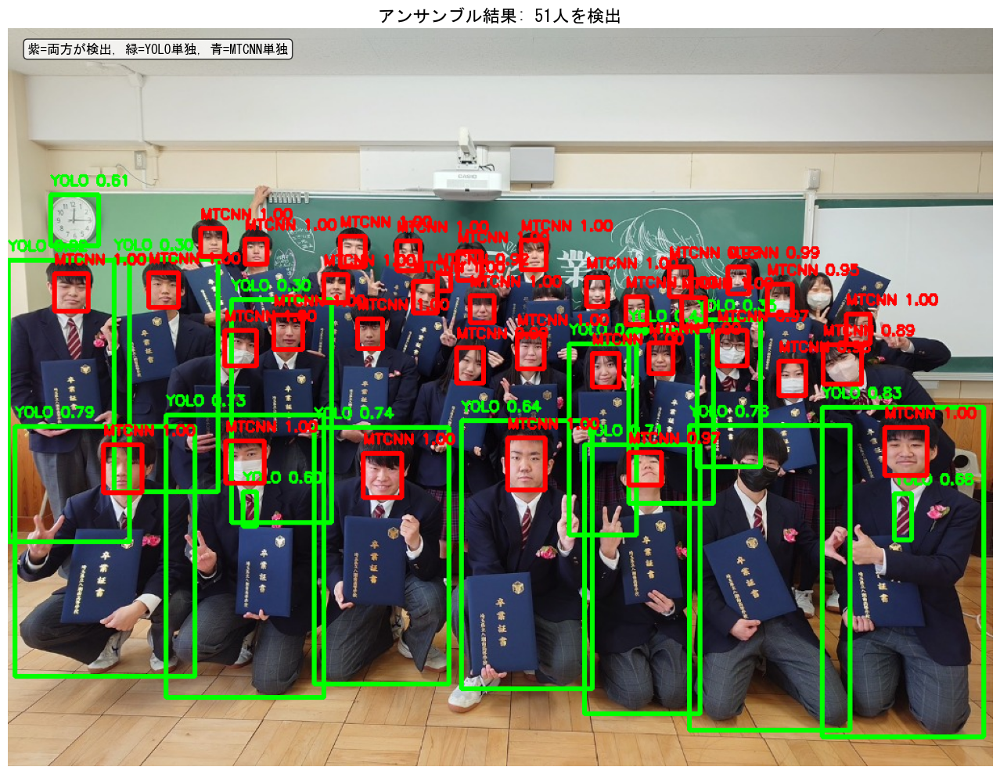

In [9]:
# アンサンブル結果の可視化
image_ensemble = image_rgb.copy()

for box in ensemble_boxes:
    x1, y1, x2, y2, conf, source, iou = box
    
    # 色分け：両方が検出=紫、YOLO単独=緑、MTCNN単独=青
    if iou > 0.0:
        color = (128, 0, 128)  # 紫（両方）
    elif source == 'YOLO':
        color = (0, 255, 0)    # 緑（YOLO単独）
    else:
        color = (255, 0, 0)    # 青（MTCNN単独）
    
    # バウンディングボックスの描画
    cv2.rectangle(image_ensemble, (x1, y1), (x2, y2), color, 3)
    
    # ラベル表示
    if iou > 0.0:
        label = f'Both {conf:.2f}'
    else:
        label = f'{source} {conf:.2f}'
    
    cv2.putText(image_ensemble, label, (x1, y1-10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

# 結果の表示
plt.figure(figsize=(15, 10))
plt.imshow(image_ensemble)
plt.title(f'アンサンブル結果: {len(ensemble_boxes)}人を検出', fontsize=16)
plt.text(0.02, 0.98, '紫=両方が検出, 緑=YOLO単独, 青=MTCNN単独', 
         transform=plt.gca().transAxes, fontsize=12, 
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
plt.axis('off')
plt.tight_layout()
plt.show()

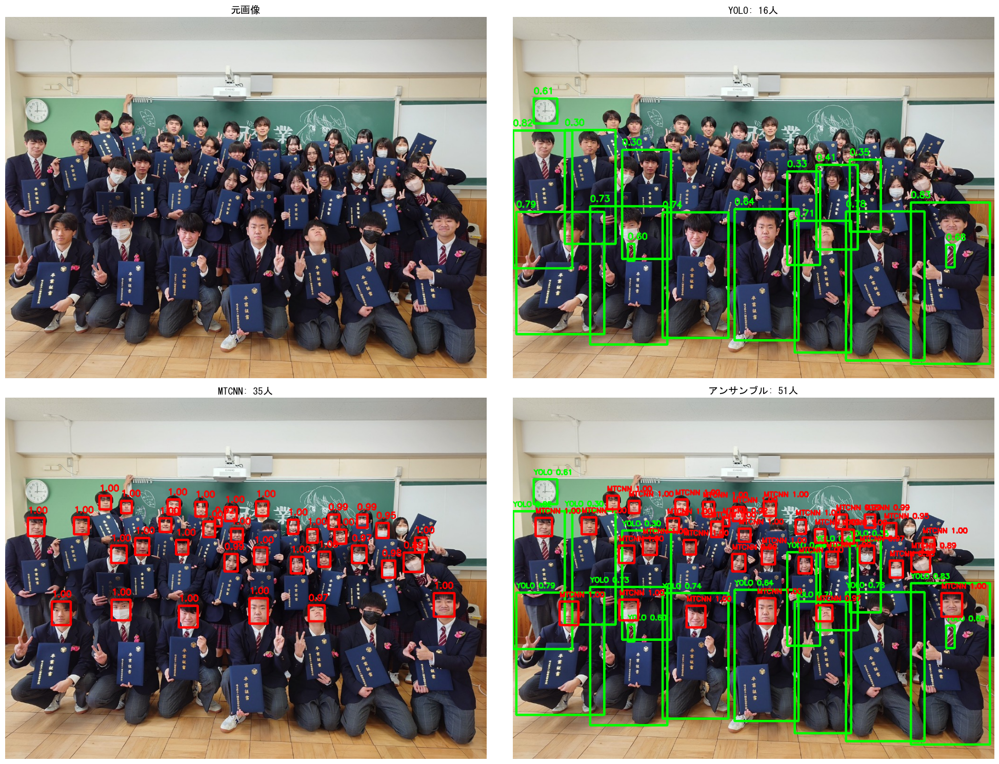

In [10]:
# 3手法の結果を並べて比較
fig, axes = plt.subplots(2, 2, figsize=(20, 15))

# 元画像
axes[0, 0].imshow(image_rgb)
axes[0, 0].set_title('元画像', fontsize=14)
axes[0, 0].axis('off')

# YOLO結果
axes[0, 1].imshow(image_yolo)
axes[0, 1].set_title(f'YOLO: {num_faces_yolo}人', fontsize=14)
axes[0, 1].axis('off')

# MTCNN結果
axes[1, 0].imshow(image_mtcnn)
axes[1, 0].set_title(f'MTCNN: {num_faces_mtcnn}人', fontsize=14)
axes[1, 0].axis('off')

# アンサンブル結果
axes[1, 1].imshow(image_ensemble)
axes[1, 1].set_title(f'アンサンブル: {len(ensemble_boxes)}人', fontsize=14)
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [11]:
# 詳細な統計情報
print("="*60)
print("アンサンブル手法の詳細分析")
print("="*60)
print(f"\n【検出数の比較】")
print(f"YOLO単独        : {num_faces_yolo:2d} 人")
print(f"MTCNN単独       : {num_faces_mtcnn:2d} 人")
print(f"アンサンブル    : {len(ensemble_boxes):2d} 人")
print(f"\n【アンサンブルの内訳】")
yolo_only = sum(1 for b in ensemble_boxes if b[5] == 'YOLO' and b[6] == 0.0)
mtcnn_only = sum(1 for b in ensemble_boxes if b[5] == 'MTCNN' and b[6] == 0.0)
both = sum(1 for b in ensemble_boxes if b[6] > 0.0)
print(f"両方が検出（統合）: {both:2d} 人 ({both/len(ensemble_boxes)*100:.1f}%)")
print(f"YOLO のみ検出   : {yolo_only:2d} 人 ({yolo_only/len(ensemble_boxes)*100:.1f}%)")
print(f"MTCNN のみ検出  : {mtcnn_only:2d} 人 ({mtcnn_only/len(ensemble_boxes)*100:.1f}%)")
print(f"\n【統合の効果】")
print(f"YOLO との差     : +{len(ensemble_boxes) - num_faces_yolo} 人")
print(f"MTCNN との差    : +{len(ensemble_boxes) - num_faces_mtcnn} 人")
print("="*60)

アンサンブル手法の詳細分析

【検出数の比較】
YOLO単独        : 16 人
MTCNN単独       : 35 人
アンサンブル    : 51 人

【アンサンブルの内訳】
両方が検出（統合）:  0 人 (0.0%)
YOLO のみ検出   : 16 人 (31.4%)
MTCNN のみ検出  : 35 人 (68.6%)

【統合の効果】
YOLO との差     : +35 人
MTCNN との差    : +16 人


### アンサンブル手法の評価

**メリット：**
-  **検出数の向上**: 単一手法より多くの顔を検出できる
-  **見逃しの削減**: 一方が見逃した顔も、もう一方が検出できる
-  **誤検出の抑制**: 両方が検出した顔は信頼性が高い
-  **ロバスト性の向上**: 様々な条件に対応しやすい

**デメリット：**
-  **処理時間の増加**: 両方の手法を実行するため時間がかかる
-  **実装の複雑さ**: IoU計算やマージ処理が必要
-  **閾値調整の必要性**: IoU閾値の最適値は画像によって異なる
-  **余計な判定**: 時計も顔とみなされる可能性がある

**適用場面：**
- 📊 **公式記録**: 正確な人数把握が最優先の場面
- 📸 **重要な集合写真**: 見逃しを最小限にしたい場合
- 🎯 **高精度が必要**: 処理時間よりも精度を重視する場合

## 4. 比較分析

YOLOとMTCNNの検出結果を並べて比較します。

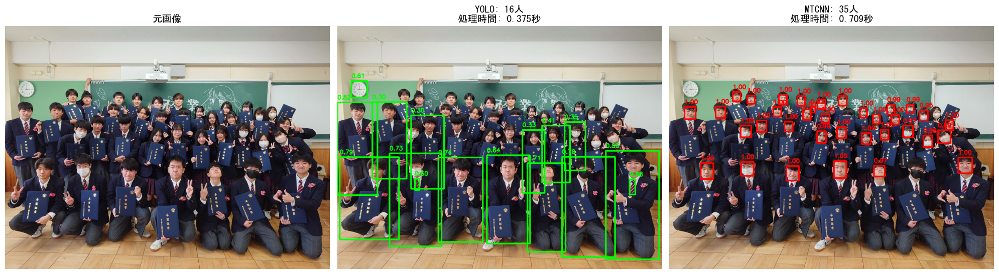

In [12]:
# 両方の結果を並べて表示
fig, axes = plt.subplots(1, 3, figsize=(20, 10))

# 元画像
axes[0].imshow(image_rgb)
axes[0].set_title('元画像', fontsize=14)
axes[0].axis('off')

# YOLO結果
axes[1].imshow(image_yolo)
axes[1].set_title(f'YOLO: {num_faces_yolo}人\n処理時間: {yolo_time:.3f}秒', fontsize=14)
axes[1].axis('off')

# MTCNN結果
axes[2].imshow(image_mtcnn)
axes[2].set_title(f'MTCNN: {num_faces_mtcnn}人\n処理時間: {mtcnn_time:.3f}秒', fontsize=14)
axes[2].axis('off')

plt.tight_layout()
plt.show()

In [13]:
# 定量的な比較
print("="*50)
print("検出結果の比較")
print("="*50)
print(f"YOLO検出数: {num_faces_yolo}人")
print(f"MTCNN検出数: {num_faces_mtcnn}人")
print(f"検出数の差: {abs(num_faces_yolo - num_faces_mtcnn)}人")
print("="*50)
print(f"YOLO処理時間: {yolo_time:.3f}秒")
print(f"MTCNN処理時間: {mtcnn_time:.3f}秒")
print(f"速度比: YOLO は MTCNN の {mtcnn_time/yolo_time:.1f}倍速い")
print("="*50)

検出結果の比較
YOLO検出数: 16人
MTCNN検出数: 35人
検出数の差: 19人
YOLO処理時間: 0.375秒
MTCNN処理時間: 0.709秒
速度比: YOLO は MTCNN の 1.9倍速い


### 検出が難しかったケース

この集合写真での分析結果：

1. **マスク着用者**
   - 顔の下半分が隠れているため、両手法とも検出精度が低下
   - 特にMTCNNは顔の特徴点を重視するため、マスクの影響を受けやすい

2. **後列の小さな顔**
   - 顔のサイズが小さいため、YOLOは見逃す傾向がある
   - MTCNNの方が小さな顔の検出に優れている

3. **横向き・下向きの顔**
   - 正面を向いていない顔は検出が難しい
   - 特に下を向いている場合、両手法とも検出できないことがある

4. **顔が重なっているケース**
   - 密集して立っている場合、顔が重なって一部が隠れることがある
   - 両手法とも、隠れた顔の検出は困難

## 5. 所感

### 今回の課題での学び

**1. 使える場面**
- **YOLO**: リアルタイムでの人数カウント（入場ゲート、イベント会場など）
- **MTCNN**: 正確な人数把握が必要な場面（公式記録、統計データなど）

**2. 精度が落ちた場面**
- マスク着用時：両手法とも顔の下半分が重要な特徴なので精度低下
- 小さな顔（後列）：YOLOは特に苦手、MTCNNも完璧ではない
- 横向き・下向きの顔：正面顔を前提としたモデルのため困難

**3. この技術が必要な理由**
- **効率化**: 30人以上の集合写真を手動で数えるのは時間がかかり、ミスも発生する
- **自動化**: イベント運営での参加者管理を自動化できる
- **データ分析**: 複数の写真から参加者数の推移を分析できる

**4. 今後の改善案**
- 両手法の結果を組み合わせて精度向上（アンサンブル手法）
- マスク着用者専用の学習データで再学習
- 手動での補正機能の追加

### 結論
卒業式や授賞式などの集合写真から人数をカウントする場合、**MTCNNの方が高精度**ですが、**YOLOの速度も魅力的**です。用途に応じて使い分けることが重要だと感じました。